In [1]:
# Importando os módulos:
import pandas as pd
import folium
from folium import plugins, Map
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
import matplotlib.pyplot as plt
import collections
import datetime
import numpy as np
import seaborn as sns
import csv 
from API_google import reverse_geocode


In [29]:
# Leitura do arquivo base
df = pd.read_csv(r"dataset_v01.csv", delimiter=";")
df = df.rename(columns={'id': 'ID_USUARIO', 'dat_nsc': 'DATA_NASCIMENTO', 'renda': 'RENDA', 'renda_SPEC': 'RENDA_FIXA', 'latitude': 'LATITUDE', 'longitude': 'LONGITUDE', 'tipo_pessoa': 'TIPO_PESSOA'})

# Criando novas colunas CIDADE, ESTADO e LOGRADOURO
df['CIDADE'] = ''
df['ESTADO'] = ''
df['LOGRADOURO'] = ''

# Formatação das coordenadas, trocado as virgulas por ponto e removendo registros sem coordenadas
df['LATITUDE'] = df['LATITUDE'].str.replace(',','.')
df['LONGITUDE'] = df['LONGITUDE'].str.replace(',','.')
#df.dropna(subset=['LATITUDE'], inplace=True)

In [ ]:
# Utilização da API Google Maps para inserção dos dados regionais, "CIDADE" e "ESTADO"
for index, row in df.iterrows():
    try:
        result = reverse_geocode(row['LATITUDE'], row['LONGITUDE'])
        df.loc[index,'CIDADE'] = result[0]
        df.loc[index,'ESTADO'] = result[1]
        df.loc[index,'LOGRADOURO'] = result[2]
        df.loc[index,'TIPO_PESSOA'] = result[3]
    except:
        pass

In [22]:
df.head()

,ID_USUARIO,DATA_NASCIMENTO,RENDA,RENDA_FIXA,LATITUDE,LONGITUDE,TIPO_PESSOA,CIDADE,ESTADO,LOGRADOURO
0,d6c0cc1d-eb61-486a-b5c3-50725ef44d61,30/01/1981 00:00,"DE R$ 1.900,00 A R$ 3.800,00","3.104,00",-4.84758,-37.78439,CPF,NaN,NaN,NaN
1,da0067e7-aa6b-4355-b373-ca17f6ac3b44,28/01/1978 00:00,"DE R$ 3.800,00 A R$ 7.600,00","5.703,00",-26.99011814,-48.63716523,CNPJ,NaN,NaN,NaN
2,2d729b8a-d53c-48e7-8bf5-33b021980c04,09/12/1954 00:00,"DE R$ 3.800,00 A R$ 7.600,00","3.901,00",-5.053671016,-42.81315203,CNPJ,NaN,NaN,NaN
3,62c0f1e6-36f2-4205-a134-232a58a6f8a5,28/08/1975 00:00,"DE R$ 788,00 A R$ 1.140,00","1.086,00",-15.059042,-48.163372,CPF,NaN,NaN,NaN
4,0cef9719-0aa3-49a2-adea-9c09c04de071,17/06/1957 00:00,"DE R$ 788,00 A R$ 1.140,00",836,-17.694658,-42.52228,CPF,NaN,NaN,NaN


In [5]:
# Criando arquivo csv com os dados tratados
df.to_csv('dataset_v02.csv', sep=';', encoding='ANSI')

In [2]:
# Nova dataframe com os dados tratados
df_spc = pd.read_csv(r"dataset_v02.csv", delimiter=';', encoding='ANSI')

In [3]:
# Tratamento das coordenadas
df_spc['LATITUDE'] = df_spc['LATITUDE'].str.replace(',','.')
df_spc['LONGITUDE'] = df_spc['LONGITUDE'].str.replace(',','.')
df_spc.head()

,ID_USUARIO,DATA_NASCIMENTO,RENDA,RENDA_FIXA,LATITUDE,LONGITUDE,TIPO_PESSOA,CIDADE,ESTADO,LOGRADOURO
0,d6c0cc1d-eb61-486a-b5c3-50725ef44d61,30/01/1981 00:00,"DE R$ 1.900,00 A R$ 3.800,00","3.104,00",-4.84758,-37.78439,CPF,Jaguaruana,Ceará,street_address
1,da0067e7-aa6b-4355-b373-ca17f6ac3b44,28/01/1978 00:00,"DE R$ 3.800,00 A R$ 7.600,00","5.703,00",-26.99011814,-48.63716523,CPF,Balneário Camboriú,Santa Catarina,street_address
2,2d729b8a-d53c-48e7-8bf5-33b021980c04,09/12/1954 00:00,"DE R$ 3.800,00 A R$ 7.600,00","3.901,00",-5.053671016,-42.81315203,CPF,Teresina,Piauí,street_address
3,62c0f1e6-36f2-4205-a134-232a58a6f8a5,28/08/1975 00:00,"DE R$ 788,00 A R$ 1.140,00","1.086,00",-15.059042,-48.163372,CNPJ,Mimoso de Goiás,Goiás,establishment
4,0cef9719-0aa3-49a2-adea-9c09c04de071,17/06/1957 00:00,"DE R$ 788,00 A R$ 1.140,00",836,-17.694658,-42.52228,CPF,Capelinha,Minas Gerais,street_address


In [4]:
# Preparando dados para inserção da idade
df_spc['DATA_NASCIMENTO'] = pd.to_datetime(df_spc['DATA_NASCIMENTO'])
df_spc['ANO'] = df_spc['DATA_NASCIMENTO'].apply(lambda x: x.year)
df_spc['IDADE']  = df_spc['ANO'].apply(lambda x: 2021 - x)
df_spc.head()

,ID_USUARIO,DATA_NASCIMENTO,RENDA,RENDA_FIXA,LATITUDE,LONGITUDE,TIPO_PESSOA,CIDADE,ESTADO,LOGRADOURO,ANO,IDADE
0,d6c0cc1d-eb61-486a-b5c3-50725ef44d61,1981-01-30,"DE R$ 1.900,00 A R$ 3.800,00","3.104,00",-4.84758,-37.78439,CPF,Jaguaruana,Ceará,street_address,1981.0,40.0
1,da0067e7-aa6b-4355-b373-ca17f6ac3b44,1978-01-28,"DE R$ 3.800,00 A R$ 7.600,00","5.703,00",-26.99011814,-48.63716523,CPF,Balneário Camboriú,Santa Catarina,street_address,1978.0,43.0
2,2d729b8a-d53c-48e7-8bf5-33b021980c04,1954-09-12,"DE R$ 3.800,00 A R$ 7.600,00","3.901,00",-5.053671016,-42.81315203,CPF,Teresina,Piauí,street_address,1954.0,67.0
3,62c0f1e6-36f2-4205-a134-232a58a6f8a5,1975-08-28,"DE R$ 788,00 A R$ 1.140,00","1.086,00",-15.059042,-48.163372,CNPJ,Mimoso de Goiás,Goiás,establishment,1975.0,46.0
4,0cef9719-0aa3-49a2-adea-9c09c04de071,1957-06-17,"DE R$ 788,00 A R$ 1.140,00",836,-17.694658,-42.52228,CPF,Capelinha,Minas Gerais,street_address,1957.0,64.0


In [5]:
# Criando nova coluna "Faixa_Etaria"
df_spc['FAIXA ETARIA'] = pd.cut(df_spc['IDADE'],
        bins = (20, 30, 40, 50, 60, 70, 80),
        labels = ('20 a 30 anos', '30 a 40 anos', '40 a 50 anos', '50 a 60 anos', '60 a 70 anos', '80 mais'))
df_spc.head()

,ID_USUARIO,DATA_NASCIMENTO,RENDA,RENDA_FIXA,LATITUDE,LONGITUDE,TIPO_PESSOA,CIDADE,ESTADO,LOGRADOURO,ANO,IDADE,FAIXA ETARIA
0,d6c0cc1d-eb61-486a-b5c3-50725ef44d61,1981-01-30,"DE R$ 1.900,00 A R$ 3.800,00","3.104,00",-4.84758,-37.78439,CPF,Jaguaruana,Ceará,street_address,1981.0,40.0,30 a 40 anos
1,da0067e7-aa6b-4355-b373-ca17f6ac3b44,1978-01-28,"DE R$ 3.800,00 A R$ 7.600,00","5.703,00",-26.99011814,-48.63716523,CPF,Balneário Camboriú,Santa Catarina,street_address,1978.0,43.0,40 a 50 anos
2,2d729b8a-d53c-48e7-8bf5-33b021980c04,1954-09-12,"DE R$ 3.800,00 A R$ 7.600,00","3.901,00",-5.053671016,-42.81315203,CPF,Teresina,Piauí,street_address,1954.0,67.0,60 a 70 anos
3,62c0f1e6-36f2-4205-a134-232a58a6f8a5,1975-08-28,"DE R$ 788,00 A R$ 1.140,00","1.086,00",-15.059042,-48.163372,CNPJ,Mimoso de Goiás,Goiás,establishment,1975.0,46.0,40 a 50 anos
4,0cef9719-0aa3-49a2-adea-9c09c04de071,1957-06-17,"DE R$ 788,00 A R$ 1.140,00",836,-17.694658,-42.52228,CPF,Capelinha,Minas Gerais,street_address,1957.0,64.0,60 a 70 anos


In [6]:
#Agrupamento por tipo de pessoas
df_CPF = df_spc[df_spc['TIPO_PESSOA'] == 'CPF']
df_CNPJ = df_spc[df_spc['TIPO_PESSOA'] == 'CNPJ']

In [9]:
#Agrupamento por Renda de pessoa fisica
group_CPF = df_CPF.groupby(['RENDA'])['ID_USUARIO'].count()
group_CPF

RENDA
DE R$ 1.900,00 A R$ 3.800,00    4039
DE R$ 3.800,00 A R$ 7.600,00    1660
DE R$ 788,00 A R$ 1.140,00      2575
MAIOR QUE R$ 7.600,00             63
Name: ID_USUARIO, dtype: int64

In [10]:
#Agrupamento por Renda de pessoa juridica
group_CNPJ = df_CNPJ.groupby(['RENDA'])['ID_USUARIO'].count()
group_CNPJ

RENDA
DE R$ 1.900,00 A R$ 3.800,00    723
DE R$ 3.800,00 A R$ 7.600,00    302
DE R$ 788,00 A R$ 1.140,00      622
MAIOR QUE R$ 7.600,00            16
Name: ID_USUARIO, dtype: int64

In [11]:
# Transformando as coordenadas LAT e LONG em numericos
df_spc['LATITUDE'] = pd.to_numeric(df_spc['LATITUDE'])
df_spc['LONGITUDE'] = pd.to_numeric(df_spc['LONGITUDE'])
# Tratando os valores da RENDA_FIXA
df_spc['RENDA_FIXA'] = df_spc['RENDA_FIXA'].str.replace('.','')
df_spc['RENDA_FIXA'] = df_spc['RENDA_FIXA'].str.replace(',','.')
df_spc['RENDA_FIXA'] = df_spc['RENDA_FIXA'].str.replace(' -   ','0.0')
df_spc['RENDA_FIXA'] = pd.to_numeric(df_spc['RENDA_FIXA'])

<ipython-input-11-6bfb96ba230d>:5: FutureWarning: The default value of regex will change from True to False in a future version. In addition, single character regular expressions will*not* be treated as literal strings when regex=True.
  df_spc['RENDA_FIXA'] = df_spc['RENDA_FIXA'].str.replace('.','')


In [12]:
df_spc.head()

,ID_USUARIO,DATA_NASCIMENTO,RENDA,RENDA_FIXA,LATITUDE,LONGITUDE,TIPO_PESSOA,CIDADE,ESTADO,LOGRADOURO,ANO,IDADE,FAIXA ETARIA
0,d6c0cc1d-eb61-486a-b5c3-50725ef44d61,1981-01-30,"DE R$ 1.900,00 A R$ 3.800,00",3104.0,-4.847580,-37.784390,CPF,Jaguaruana,Ceará,street_address,1981.0,40.0,30 a 40 anos
1,da0067e7-aa6b-4355-b373-ca17f6ac3b44,1978-01-28,"DE R$ 3.800,00 A R$ 7.600,00",5703.0,-26.990118,-48.637165,CPF,Balneário Camboriú,Santa Catarina,street_address,1978.0,43.0,40 a 50 anos
2,2d729b8a-d53c-48e7-8bf5-33b021980c04,1954-09-12,"DE R$ 3.800,00 A R$ 7.600,00",3901.0,-5.053671,-42.813152,CPF,Teresina,Piauí,street_address,1954.0,67.0,60 a 70 anos
3,62c0f1e6-36f2-4205-a134-232a58a6f8a5,1975-08-28,"DE R$ 788,00 A R$ 1.140,00",1086.0,-15.059042,-48.163372,CNPJ,Mimoso de Goiás,Goiás,establishment,1975.0,46.0,40 a 50 anos
4,0cef9719-0aa3-49a2-adea-9c09c04de071,1957-06-17,"DE R$ 788,00 A R$ 1.140,00",836.0,-17.694658,-42.522280,CPF,Capelinha,Minas Gerais,street_address,1957.0,64.0,60 a 70 anos


In [13]:
# Salvando um novo dataset com as FAIXA_ETARIA
df_spc.to_csv('dataset_faixa_etaria.csv',index=False)

In [19]:
df_corr = df_spc[['RENDA', 'RENDA_FIXA', 'LATITUDE', 'LONGITUDE', 'TIPO_PESSOA', 'CIDADE', 'ESTADO', 'LOGRADOURO', 'IDADE']]
df_corr

,RENDA,RENDA_FIXA,LATITUDE,LONGITUDE,TIPO_PESSOA,CIDADE,ESTADO,LOGRADOURO,IDADE
0,"DE R$ 1.900,00 A R$ 3.800,00",3104.0,-4.847580,-37.784390,CPF,Jaguaruana,Ceará,street_address,40.0
1,"DE R$ 3.800,00 A R$ 7.600,00",5703.0,-26.990118,-48.637165,CPF,Balneário Camboriú,Santa Catarina,street_address,43.0
2,"DE R$ 3.800,00 A R$ 7.600,00",3901.0,-5.053671,-42.813152,CPF,Teresina,Piauí,street_address,67.0
3,"DE R$ 788,00 A R$ 1.140,00",1086.0,-15.059042,-48.163372,CNPJ,Mimoso de Goiás,Goiás,establishment,46.0
4,"DE R$ 788,00 A R$ 1.140,00",836.0,-17.694658,-42.522280,CPF,Capelinha,Minas Gerais,street_address,64.0
...,...,...,...,...,...,...,...,...,...
9995,"DE R$ 1.900,00 A R$ 3.800,00",2776.0,-11.609372,-47.047506,CPF,Porto Alegre do Tocantins,Tocantins,route,42.0
9996,"DE R$ 3.800,00 A R$ 7.600,00",4099.0,-15.650497,-47.793321,CPF,Brasília,Distrito Federal,street_address,41.0
9997,"DE R$ 788,00 A R$ 1.140,00",1052.0,-8.330679,-36.136897,CPF,São Caetano,Pernambuco,street_address,45.0
9998,"DE R$ 788,00 A R$ 1.140,00",958.0,NaN,NaN,CNPJ,NaN,NaN,NaN,36.0


In [21]:
state_encoder = LabelEncoder()
state_encoder.fit(df_corr['RENDA'].unique())
df_corr['RENDA'] = state_encoder.transform(df_corr['RENDA'])
df_corr['RENDA'].unique()

<ipython-input-21-c2b8a4ad396a>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_corr['RENDA'] = state_encoder.transform(df_corr['RENDA'])


array([0, 1, 2, 3])

In [22]:
state_encoder = LabelEncoder()
state_encoder.fit(df_corr['CIDADE'].unique())
df_corr['CIDADE'] = state_encoder.transform(df_corr['CIDADE'])
df_corr['CIDADE'].unique()

<ipython-input-22-ee9ab4cd2c64>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_corr['CIDADE'] = state_encoder.transform(df_corr['CIDADE'])


array([ 993,  160, 1996, ..., 2017, 1851, 1551])

In [23]:
state_encoder = LabelEncoder()
state_encoder.fit(df_corr['ESTADO'].unique())
df_corr['ESTADO'] = state_encoder.transform(df_corr['ESTADO'])
df_corr['ESTADO'].unique()

<ipython-input-23-624ce4a75b17>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_corr['ESTADO'] = state_encoder.transform(df_corr['ESTADO'])


array([ 5, 23, 17,  8, 12,  9, 29,  4, 16, 19, 15, 28, 20, 13, 30, 10, 11,
       14,  1,  3, 21, 22,  0,  6,  7, 24, 18,  2, 26, 27, 25])

In [24]:
state_encoder = LabelEncoder()
state_encoder.fit(df_corr['TIPO_PESSOA'].unique())
df_corr['TIPO_PESSOA'] = state_encoder.transform(df_corr['TIPO_PESSOA'])
df_corr['TIPO_PESSOA'].unique()

<ipython-input-24-28ce5397e9e5>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_corr['TIPO_PESSOA'] = state_encoder.transform(df_corr['TIPO_PESSOA'])


array([1, 0])

In [25]:
state_encoder = LabelEncoder()
state_encoder.fit(df_corr['LOGRADOURO'].unique())
df_corr['LOGRADOURO'] = state_encoder.transform(df_corr['LOGRADOURO'])
df_corr['LOGRADOURO'].unique()

<ipython-input-25-69a7ce20ee3f>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_corr['LOGRADOURO'] = state_encoder.transform(df_corr['LOGRADOURO'])


array([29, 25, 27, 30,  3, 28,  5, 17, 22,  7, 12,  0,  4, 15,  9,  8, 13,
       24, 23, 19, 11, 26, 20, 16, 10,  2,  6, 18,  1, 21, 14])

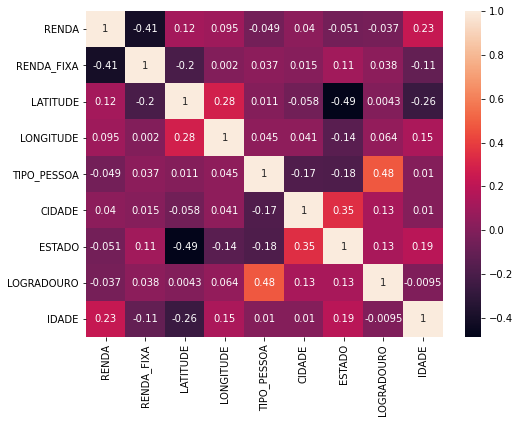

In [26]:
# Mapa de corelação entre RENDA, RENDA_FIXA, LATITUDE, LONGTUDE, TIPO_PESSOA, CIDADE, ESTADO, LOGRADOURO E IDADE
corr_df = df_corr.corr(method='pearson')

plt.figure(figsize=(8, 6))
sns.heatmap(corr_df, annot=True)
plt.show()

In [30]:
# Mapa de calor das rendas com lat e long
df_spc=df_spc.dropna(subset=['RENDA'])
df_spc=df_spc.dropna(subset=['LONGITUDE'])
df_spc=df_spc.dropna(subset=['LATITUDE'])
lat = df_spc.LATITUDE.tolist()
lng = df_spc.LONGITUDE.tolist()
renda = df_spc.RENDA.tolist() 
m = folium.Map(location=[-5.7793, -35.2009], tiles='cartodbdark_matter')
 
HeatMap(list(zip(lat, lng))).add_to(m)
m

In [33]:
m = folium.Map(tiles='cartodbdark_matter')
mc = MarkerCluster()

for index, creche in df_spc.iterrows():
  mc.add_child(folium.Marker([creche['LATITUDE'], creche['LONGITUDE']], 
              popup=str(creche['RENDA']),
              icon=folium.Icon(icon=''))).add_to(m)
m